## Import Libraries

In [15]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
df = pd.read_excel('E Commerce Dataset.xlsx', sheet_name='E Comm')
df.head(8)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.000,Mobile Phone,3,6.000,Debit Card,Female,3.000,3,Laptop & Accessory,2,Single,9,1,11.000,1.000,1.000,5.000,159.930
1,50002,1,NaN,Phone,1,8.000,UPI,Male,3.000,4,Mobile,3,Single,7,1,15.000,0.000,1.000,0.000,120.900
2,50003,1,NaN,Phone,1,30.000,Debit Card,Male,2.000,4,Mobile,3,Single,6,1,14.000,0.000,1.000,3.000,120.280
3,50004,1,0.000,Phone,3,15.000,Debit Card,Male,2.000,4,Laptop & Accessory,5,Single,8,0,23.000,0.000,1.000,3.000,134.070
4,50005,1,0.000,Phone,1,12.000,CC,Male,NaN,3,Mobile,5,Single,3,0,11.000,1.000,1.000,3.000,129.600
5,50006,1,0.000,Computer,1,22.000,Debit Card,Female,3.000,5,Mobile Phone,5,Single,2,1,22.000,4.000,6.000,7.000,139.190
6,50007,1,NaN,Phone,3,11.000,Cash on Delivery,Male,2.000,3,Laptop & Accessory,2,Divorced,4,0,14.000,0.000,1.000,0.000,120.860
7,50008,1,NaN,Phone,1,6.000,CC,Male,3.000,3,Mobile,2,Divorced,3,1,16.000,2.000,2.000,0.000,122.930


In [17]:
df.columns

Index(['CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier', 'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed',
       'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [19]:
df.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000,5630.000,5366.000,5630.000,5379.000,5375.000,5630.000,5630.000,5630.000,5630.000,5365.000,5374.000,5372.000,5323.000,5630.000
mean,52815.500,0.168,10.190,1.655,15.640,2.932,3.689,3.067,4.214,0.285,15.708,1.751,3.008,4.543,177.223
std,1625.385,0.374,8.557,0.915,8.531,0.722,1.024,1.380,2.584,0.451,3.675,1.895,2.940,3.654,49.207
min,50001.000,0.000,0.000,1.000,5.000,0.000,1.000,1.000,1.000,0.000,11.000,0.000,1.000,0.000,0.000
25%,51408.250,0.000,2.000,1.000,9.000,2.000,3.000,2.000,2.000,0.000,13.000,1.000,1.000,2.000,145.770
50%,52815.500,0.000,9.000,1.000,14.000,3.000,4.000,3.000,3.000,0.000,15.000,1.000,2.000,3.000,163.280
75%,54222.750,0.000,16.000,3.000,20.000,3.000,4.000,4.000,6.000,1.000,18.000,2.000,3.000,7.000,196.393
max,55630.000,1.000,61.000,3.000,127.000,5.000,6.000,5.000,22.000,1.000,26.000,16.000,16.000,46.000,324.990


In [20]:
for col in df.columns:
    if df[col].dtype == 'object':
        print(f'Unique values in column {col}: {df[col].unique()}')

Unique values in column PreferredLoginDevice: ['Mobile Phone' 'Phone' 'Computer']
Unique values in column PreferredPaymentMode: ['Debit Card' 'UPI' 'CC' 'Cash on Delivery' 'E wallet' 'COD' 'Credit Card']
Unique values in column Gender: ['Female' 'Male']
Unique values in column PreferedOrderCat: ['Laptop & Accessory' 'Mobile' 'Mobile Phone' 'Others' 'Fashion' 'Grocery']
Unique values in column MaritalStatus: ['Single' 'Divorced' 'Married']


## Exploratory Analysis

##### Does the gender of a customer have a significant impact on their likelihood to churn?

##### Understanding the impact of gender on churn can provide insights into the factors that influence customer satisfaction and loyalty. This information can help the company tailor their marketing and customer service strategies to better meet the needs of male and female customers.

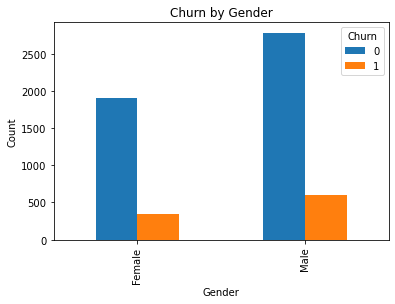

In [22]:
grouped = df.groupby(['Gender', 'Churn']).count()['CustomerID']

grouped.unstack().plot(kind='bar', stacked=False)

plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Churn by Gender')

plt.show()

#### The chart above shows that the likelihood of churn by gender is very similar.

#### 2 Does a customer's tenure have a significant impact on their likelihood to churn?

#### Knowing the relationship between tenure and churn can help the company identify which customers are most at risk of leaving, so they can take proactive measures to retain these customers. This information can also help the company to understand which customer segments are most valuable to their business and why.

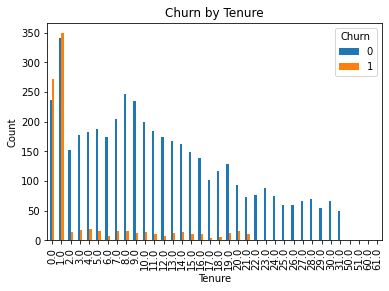

In [23]:
grouped = df.groupby(['Tenure', 'Churn']).count()['CustomerID']

# Plot the data
grouped.unstack().plot(kind='bar', stacked=False)

# Add labels and title to the plot
plt.xlabel('Tenure')
plt.ylabel('Count')
plt.title('Churn by Tenure')

# Show the plot
plt.show()

#### It is notable that the possibility of churn occurs more easily with a lower tenure.

#### 3 Is there a significant relationship between a customer's preferred payment method and their likelihood to churn?

#### Understanding the relationship between preferred payment method and churn can help the company identify any barriers to customer retention that may be related to the payment process. This information can be used to make improvements to the payment process and increase customer satisfaction, leading to reduced churn.

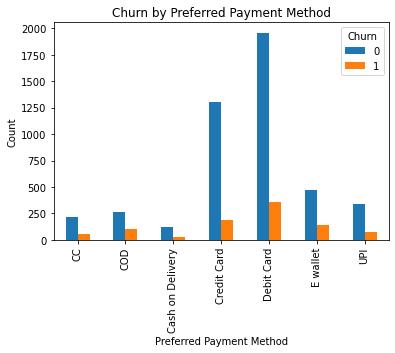

In [26]:
grouped = df.groupby(['PreferredPaymentMode', 'Churn']).count()['CustomerID']

# Plot the data
grouped.unstack().plot(kind='bar', stacked=False)

# Add labels and title to the plot
plt.xlabel('Preferred Payment Method')
plt.ylabel('Count')
plt.title('Churn by Preferred Payment Method')

# Show the plot
plt.show()

#### Customers who use credit cards and debit cards tend not to churn

## Data Cleaning & Feature Selection

#### Handling missing values

In [27]:
print(df.isnull().sum())

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64


In [28]:
df = df.fillna(df.mode().iloc[0])

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5630 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5630 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

### Impute missing values with the mode of each column

### Numerical Features

### Let's take a look at the correlation matrix:

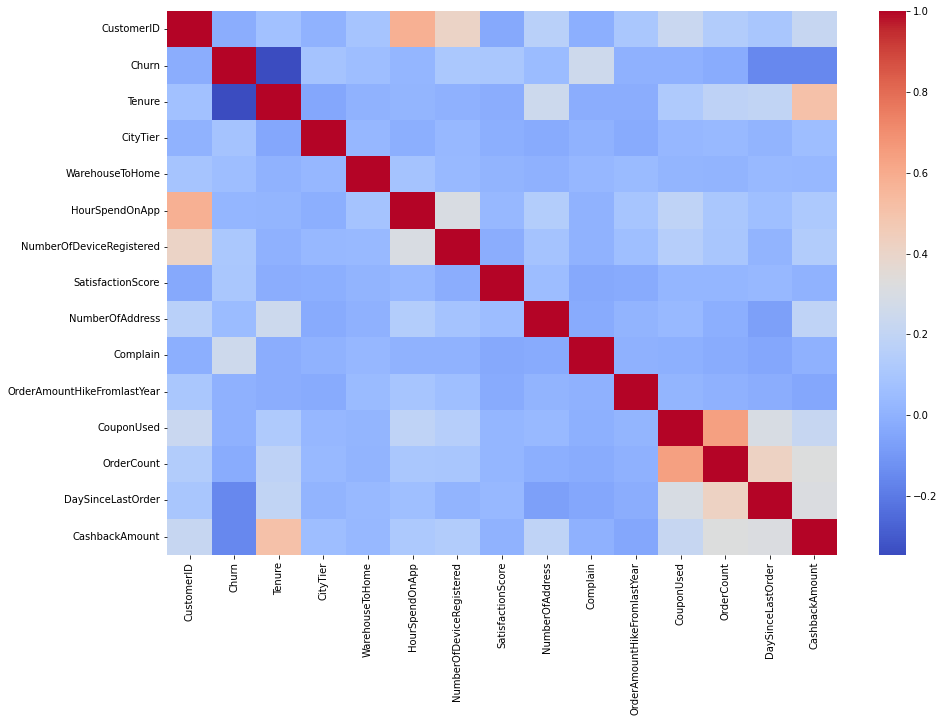

In [32]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), cmap='coolwarm')
plt.show()

#### The correlation matrix shows that coupon used, order count, days since last order, and cashback amount are positively correlated. This means that as the value of one variable increases, the value of the other variables is likely to increase as well. This could indicate that customers who use coupons, place more orders, have made their last order more recently, and receive a higher cashback amount are more likely to be active and engaged with the company.

#### On the other hand, tenure is negatively correlated with churn. This suggests that customers who have been with the company for a longer period of time are less likely to leave compared to those with shorter tenures. This could be due to increased loyalty and satisfaction with the company's products and services over time.

In [34]:
# Eliminating irrelevant columns:
df = df.drop("CustomerID", axis=1)

## Categorical Features

In [36]:
# The chi-square test can be used in feature selection to check the dependence between two categorical variables.
from scipy.stats import chi2_contingency

cat_features = df.select_dtypes(include=['object']).columns

for feature in cat_features:
    cross_tab = pd.crosstab(df[feature], df['Churn'])
    stat, p, dof, expected = chi2_contingency(cross_tab)
    print(f"{feature}: Chi-square Statistic = {stat}, p-value = {p}")
    
    alpha = 0.05
    if p > alpha:
        print(f"{feature} is NOT significantly related to churn")
    else:
        print(f"{feature} is significantly related to churn")

PreferredLoginDevice: Chi-square Statistic = 73.53679418373687, p-value = 1.0756922373255213e-16
PreferredLoginDevice is significantly related to churn
PreferredPaymentMode: Chi-square Statistic = 77.89682023026812, p-value = 9.708708511076305e-15
PreferredPaymentMode is significantly related to churn
Gender: Chi-square Statistic = 4.662908495367532, p-value = 0.030820940334890086
Gender is significantly related to churn
PreferedOrderCat: Chi-square Statistic = 288.63939355672443, p-value = 2.7708325346337454e-60
PreferedOrderCat is significantly related to churn
MaritalStatus: Chi-square Statistic = 188.6710396770566, p-value = 1.073011277910542e-41
MaritalStatus is significantly related to churn


#### The results of the chi-square test show that the PreferredLoginDevice, PreferredPaymentMode, Gender, PreferedOrderCat, and MaritalStatus features are all significantly related to churn. The p-values for each feature are well below the threshold of 0.05, indicating that there is a statistically significant relationship between each of these features and churn.

#### The PreferredLoginDevice feature has the highest chi-square statistic value, suggesting that the choice of login device is highly related to churn. Similarly, the PreferredPaymentMode feature also has a high chi-square statistic value, indicating that the choice of payment mode is also significantly related to churn.

#### Gender, PreferedOrderCat, and MaritalStatus also have significant chi-square statistic values and p-values, suggesting that these features also play a role in determining churn. These results highlight the importance of considering the effects of demographic factors, such as gender and marital status, as well as customer preferences, such as login device and payment mode, when analyzing churn.

In [37]:
# Converting the categorical features into dummy variables:
df= pd.get_dummies(df, columns=df.select_dtypes(['object']).columns)

In [38]:
df

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,PreferredPaymentMode_CC,PreferredPaymentMode_COD,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender_Female,Gender_Male,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,1,4.000,3,6.000,3.000,3,2,9,1,11.000,1.000,1.000,5.000,159.930,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1
1,1,1.000,1,8.000,3.000,4,3,7,1,15.000,0.000,1.000,0.000,120.900,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1
2,1,1.000,1,30.000,2.000,4,3,6,1,14.000,0.000,1.000,3.000,120.280,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
3,1,0.000,3,15.000,2.000,4,5,8,0,23.000,0.000,1.000,3.000,134.070,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1
4,1,0.000,1,12.000,3.000,3,5,3,0,11.000,1.000,1.000,3.000,129.600,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1
5,1,0.000,1,22.000,3.000,5,5,2,1,22.000,4.000,6.000,7.000,139.190,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1
6,1,1.000,3,11.000,2.000,3,2,4,0,14.000,0.000,1.000,0.000,120.860,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0
7,1,1.000,1,6.000,3.000,3,2,3,1,16.000,2.000,2.000,0.000,122.930,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0
8,1,13.000,3,9.000,3.000,4,3,2,1,14.000,0.000,1.000,2.000,126.830,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0
9,1,1.000,1,31.000,2.000,5,3,2,0,12.000,1.000,1.000,1.000,122.930,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1


In [39]:
# Model
from sklearn.model_selection import train_test_split

X = df.drop('Churn', axis=1) 
y = df['Churn'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [40]:
y_train.value_counts()

0    3743
1     761
Name: Churn, dtype: int64

In [41]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [43]:
# Model :1

In [44]:
from sklearn.linear_model import LogisticRegression
lr_clf = LogisticRegression(random_state = 0)
lr_clf.fit(X_train, y_train)

print('Accuracy on training set:',lr_clf.score(X_train,y_train))
print('Accuracy on test set:',lr_clf.score(X_test,y_test))

Accuracy on training set: 0.8989786856127886
Accuracy on test set: 0.8854351687388987


In [45]:
# Model 2: Naive Bayes on churn

In [46]:
from sklearn.naive_bayes import GaussianNB
nb_clf= GaussianNB()
nb_clf.fit(X_train, y_train)

print('Accuracy on training set:',nb_clf.score(X_train,y_train))
print('Accuracy on test set:',nb_clf.score(X_test,y_test))

Accuracy on training set: 0.7506660746003553
Accuracy on test set: 0.7468916518650088


In [47]:
# Model 3: RandomForest Regression on churn

In [48]:
from sklearn.ensemble import RandomForestRegressor
rf_clf = RandomForestRegressor(n_estimators = 10, random_state = 0)
rf_clf.fit(X_train, y_train)

print('Accuracy on training set:',rf_clf.score(X_train,y_train))
print('Accuracy on test set:',rf_clf.score(X_test,y_test))

Accuracy on training set: 0.9510610608045224
Accuracy on test set: 0.7297748771306374


In [49]:
# Model 4: Decision Tree on churn

In [50]:
from sklearn.tree import DecisionTreeClassifier
dec_clf = DecisionTreeClassifier()
dec_clf.fit(X_train, y_train)

print('Accuracy on training set:',dec_clf.score(X_train, y_train))
print('Accuracy on test set:',dec_clf.score(X_test, y_test))

Accuracy on training set: 1.0
Accuracy on test set: 0.9582593250444049


In [51]:
# The logistic regression and decision tree models showed good accuracy results, with the decision tree model achieving a higher accuracy score on the test set. These results suggest that using machine learning models can be an effective method for predicting customer churn.